<a href="https://colab.research.google.com/github/atheostheos/ML_2023/blob/main/10_Computer_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Основы компьютерного зрения

## Обработка изображений с помощью библиотеки OpenCV

### Подключение необходимых библиотек

In [ ]:
from skimage.io import imread
import matplotlib.pyplot as plt
import numpy as np
import cv2

### Чтение изображения из файла и преобразование в многомерный массив

(2397, 3475, 3)


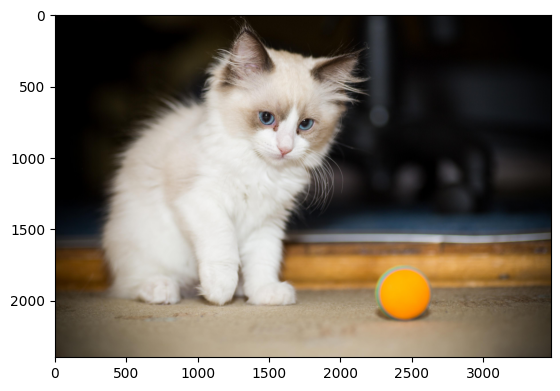

In [ ]:
orig_img = imread('https://imageio.forbes.com/specials-images/imageserve/6082931ef598a85b055afe77/0x0.jpg')
#orig_img = imread('https://cdn.artphotolimited.com/images/5ca5bf82ce46dc3d348294d2/1000x1000/le-royaume-du-jaguar.jpg')

print(orig_img.shape)

plt.imshow(orig_img)

### Именение размера изображения

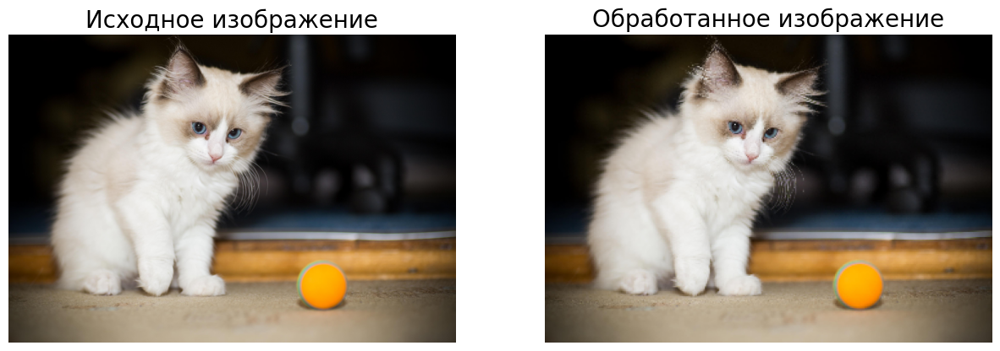

In [ ]:
height = 240
width = 347
resized_img = cv2.resize(orig_img, (width, height)) # Основная команда

font_size = 20
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(orig_img)
plt.subplot(1, 2, 2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)

plt.show()

### Кадрирование изображения

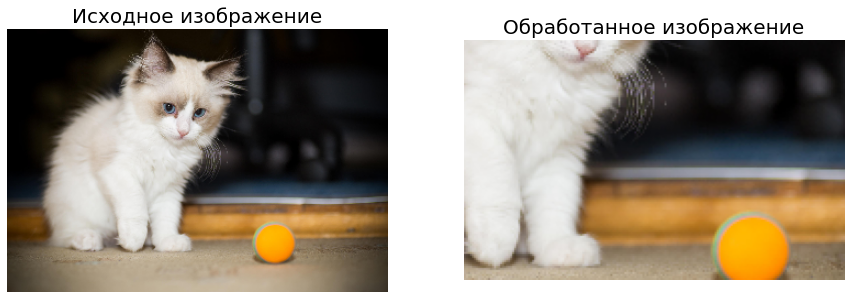

In [ ]:
cropped_img = resized_img[90:210, 100:290] # Основная команда

font_size = 20
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)
plt.subplot(1, 2, 2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(cropped_img )

plt.show()

### Рисование прямоугольников

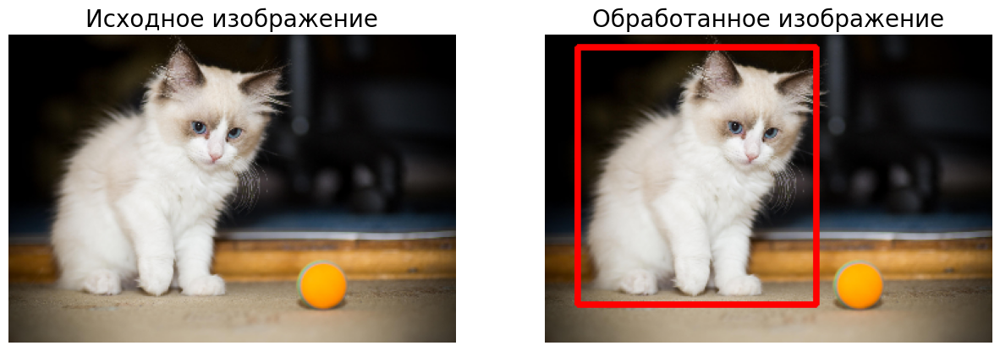

In [ ]:
rect_img = resized_img.copy()
cv2.rectangle(rect_img, (25, 10), (210, 210), (255, 0, 0), 4) # Основная команда

font_size = 20
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)
plt.subplot(1, 2, 2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(rect_img)

plt.show()

### Изменение цветового пространства изображения

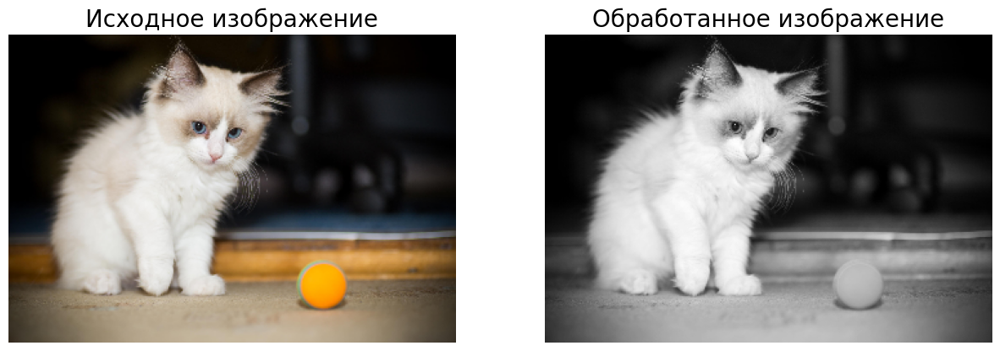

In [ ]:
gray_img = cv2.cvtColor(resized_img, cv2.COLOR_RGB2GRAY) # Основная команда

font_size = 20
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)
plt.subplot(1, 2, 2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(gray_img, cmap='gray')

plt.show()

**RGB-пространство** представляет собой куб с длиной ребра 256, в котором любой цвет задается координатами соответствующей точки на этом кубе. Широкое распространение такой модели формирования цвета объясняется тем, что на экране телефона или монитора компьютера изображение формируется за счет точек трех цветов — синего, зеленого и красного.

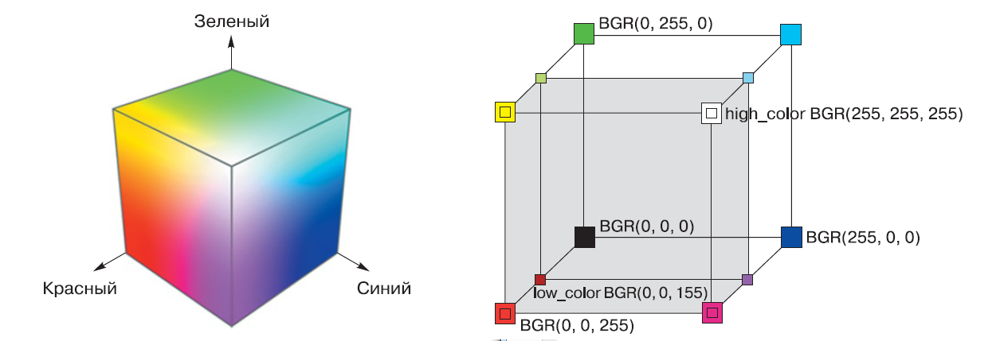

**HSV(B) (Hue, Saturation, Value (Brightness))** — модель цвета, координатами которой являются:

Hue — цветовой тон, который располагается в пределах от 0 до 360 градусов. В операционной системе Windows спектр цвета разделён на 240 оттенков;

Saturation — насыщенность, которая варьируется в пределах от 0 до 100. Чем ближе данный параметр к нулю, тем ближе цвет к серому и наоборот: чем выше цифра, тем цвет «чище»;

Value — яркость. Значение параметра варьируется от 0 до 100.

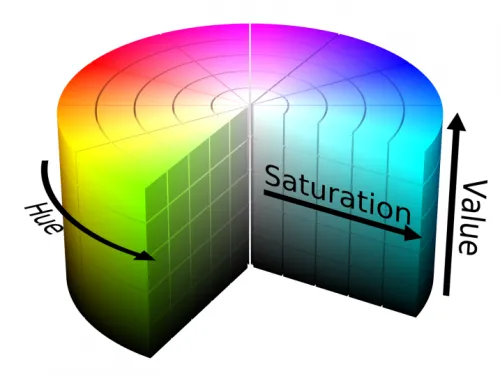

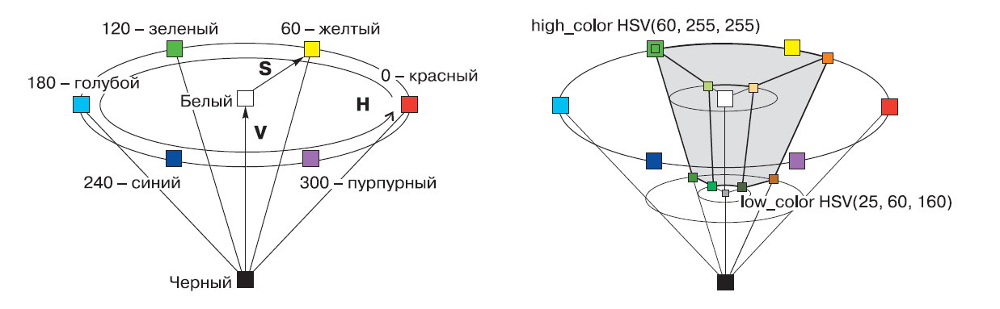

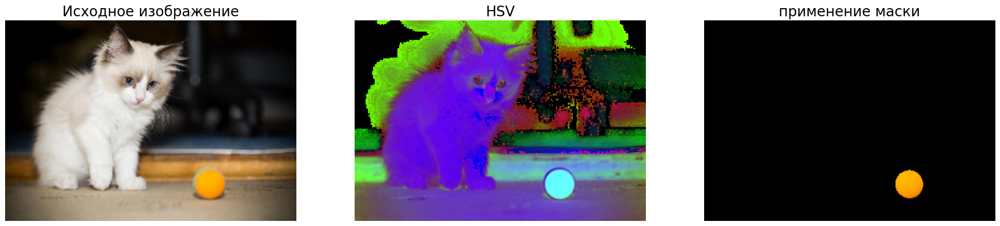

In [ ]:
hsv_img = cv2.cvtColor(resized_img, cv2.COLOR_BGR2HSV) # Основная команда


mask = cv2.inRange(hsv_img, (50, 240, 150), (255, 255, 255))
imask = mask>0
orange = np.zeros_like(resized_img, np.uint8)
orange[imask] = resized_img[imask]


font_size = 20
plt.figure(figsize=(25, 10))
plt.subplot(1, 3, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)
plt.subplot(1, 3, 2).set_title('HSV', fontsize = font_size); plt.axis('off')
plt.imshow(hsv_img, cmap='gray')
plt.subplot(1, 3, 3).set_title('применение маски', fontsize = font_size); plt.axis('off')
plt.imshow(orange)

plt.show()

### Применение фильтра размытия

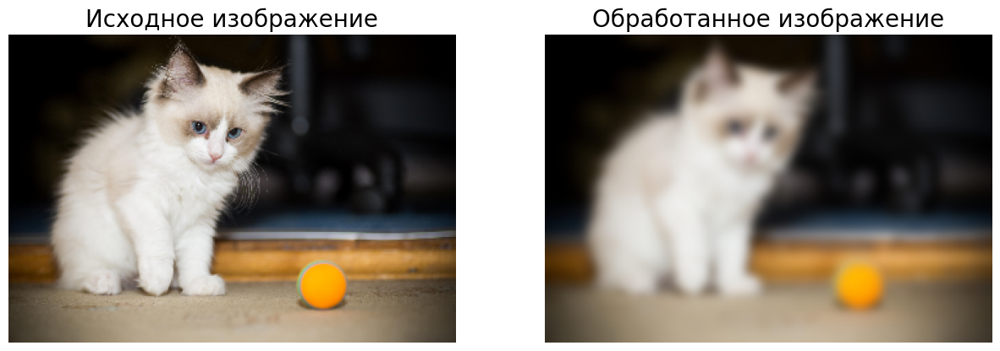

In [ ]:
blur_img = cv2.GaussianBlur(resized_img, (21, 21), 0) # Основная команда

font_size = 20
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)
plt.subplot(1, 2, 2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(blur_img)

plt.show()

### Детектор границ Кенни (Canny)

В зависимости от предобработки фотографий получается разный результат при одних и тех же настройках детектора

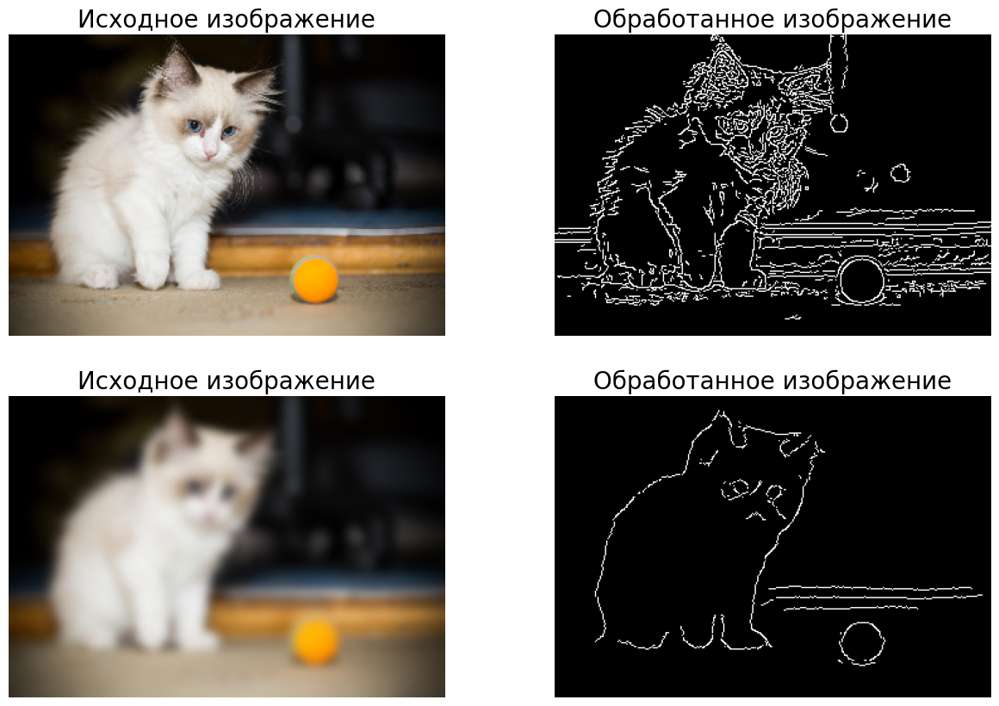

In [ ]:
edges1_img = cv2.Canny(resized_img, threshold1 = 50, threshold2 = 80)  # Основная команда
edges2_img = cv2.Canny(blur_img,    threshold1 = 50, threshold2 = 80)  # Основная команда

font_size = 20
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)
plt.subplot(2, 2, 2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(edges1_img, cmap = 'gray')
plt.subplot(2, 2, 3).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(blur_img)
plt.subplot(2, 2, 4).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(edges2_img, cmap = 'gray')

plt.show()

### Базовое преобразование Хафа для поиска прямых и окружностей

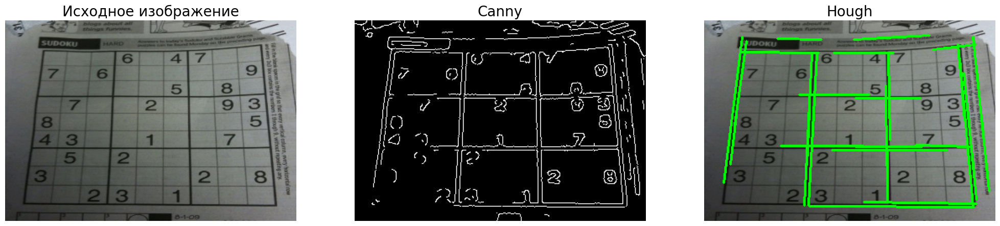

In [ ]:
import cv2
from skimage.io import imread
from matplotlib import pyplot as plt
import numpy as np
img = imread('http://accord-framework.net/docs/images/imaging/hough-input.png')

height = 240
width = 347
resized_img = cv2.resize(img, (width, height))
img_copy = resized_img.copy()

blur_img = cv2.GaussianBlur(resized_img, (11, 11), 0)

edges_img = cv2.Canny(blur_img, 50, 60)

lines = cv2.HoughLinesP(edges_img, rho = 1, theta = 1 * np.pi / 180, threshold = 30, minLineLength = 50, maxLineGap = 10)

for line in lines:
    for x1, y1, x2, y2 in line:
        hough_lines_img = cv2.line(img_copy ,(x1,y1),(x2,y2),color = (0,255,0), thickness = 2)

font_size = 20
plt.figure(figsize=(25, 8))
plt.subplot(1, 3, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(resized_img)
plt.subplot(1, 3, 2).set_title('Canny', fontsize = font_size); plt.axis('off')
plt.imshow(edges_img, cmap = 'gray')
plt.subplot(1, 3, 3).set_title('Hough', fontsize = font_size); plt.axis('off')
plt.imshow(hough_lines_img)
plt.show()

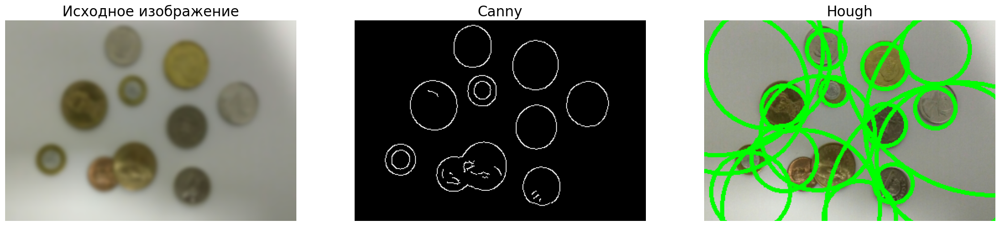

In [ ]:
import cv2
from skimage.io import imread
from matplotlib import pyplot as plt
import numpy as np
img = imread('https://raw.githubusercontent.com/manasiye/Detect-Coins-using-Hough_Transform/master/HoughCircles.jpg')

height = 240
width = 347
resized_img = cv2.resize(img, (width, height))
img_copy = resized_img.copy()

blur_img = cv2.GaussianBlur(resized_img, (13,13), 0)

edges_img = cv2.Canny(blur_img, 50, 60)

circles = cv2.HoughCircles(edges_img, cv2.HOUGH_GRADIENT, 10, 50)

for circle in circles:
    for (x, y, r) in circle:
        hough_img = cv2.circle(img_copy, (int(x), int(y)), int(r), (0, 255, 0), 4)

font_size = 20
plt.figure(figsize=(25, 8))
plt.subplot(1, 3, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(blur_img)
plt.subplot(1, 3, 2).set_title('Canny', fontsize = font_size); plt.axis('off')
plt.imshow(edges_img, cmap = 'gray')
plt.subplot(1, 3, 3).set_title('Hough', fontsize = font_size); plt.axis('off')
plt.imshow(hough_img)
plt.show()

### Проективные преобразования

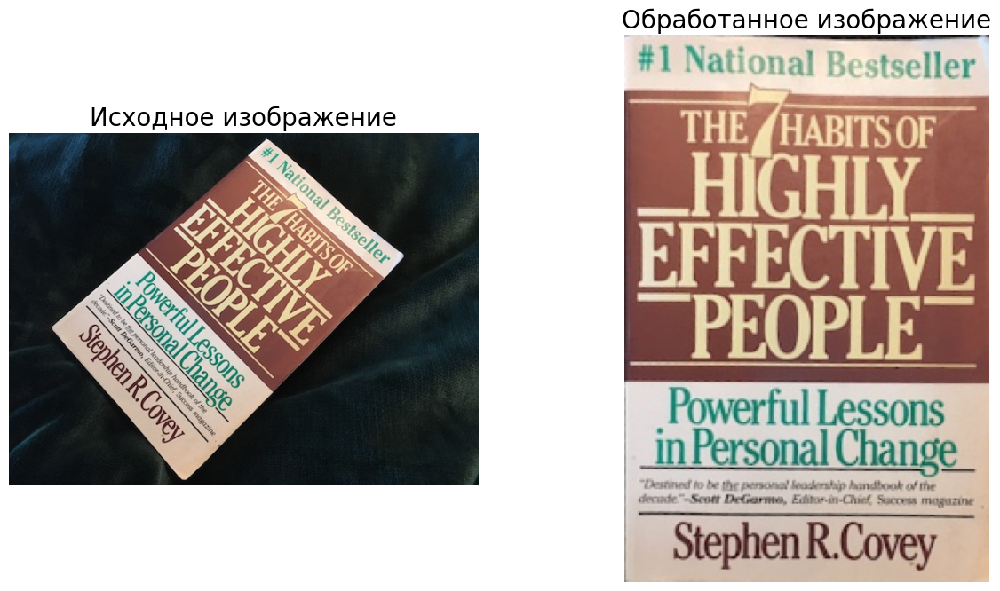

In [ ]:
import cv2
from skimage.io import imread
from matplotlib import pyplot as plt
import numpy as np
img = imread('https://images.squarespace-cdn.com/content/v1/52d707a1e4b0cca896983732/1496409522326-F92L9BJ6UJFJ7FA608F6/image-asset.jpeg')

pts1 = np.float32([[330, 9],[505, 157],[224, 443],[54, 249]])
pts2 = np.float32([[0,0],[200,0],[200,300],[0,300]])

transformation_matrix = cv2.getPerspectiveTransform(pts1, pts2)
final_img = cv2.warpPerspective(img, M = transformation_matrix, dsize = (200, 300))
final_img = cv2.resize(final_img, (200, 300))

plt.figure(figsize=(15, 8))
plt.subplot(1,2,1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(img)
plt.subplot(1,2,2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(final_img)
plt.show()

### Нахождение контуров

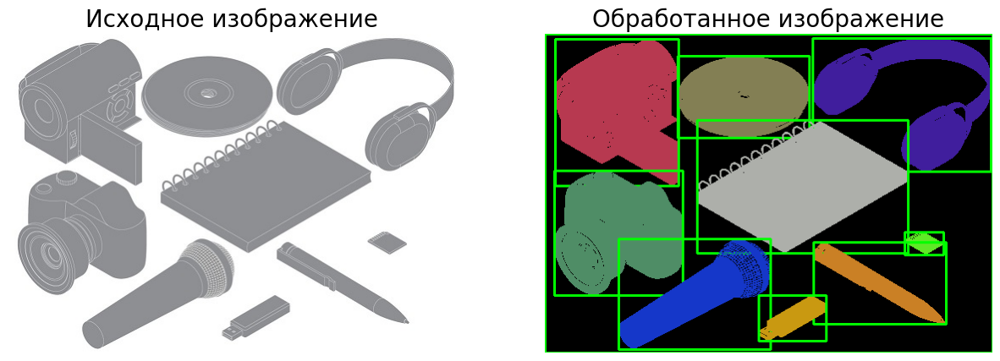

In [ ]:
import cv2
from skimage.io import imread
from matplotlib import pyplot as plt
import numpy as np
img = imread('https://i.stack.imgur.com/4WFaG.jpg')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# binarize the image
ret, bw = cv2.threshold(gray, 128, 255,
cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

# find connected components
connectivity = 10
nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(bw, connectivity, cv2.CV_32S)
sizes = stats[1:, -1]; nb_components = nb_components - 1
min_size = 12050 #threshhold value for objects in scene
img2 = np.zeros((img.shape), np.uint8)
for i in range(0, nb_components+1):
    # use if sizes[i] >= min_size: to identify your objects
    color = np.random.randint(255,size=3)
    # draw the bounding rectangele around each object
    cv2.rectangle(img2, (stats[i][0],stats[i][1]),(stats[i][0]+stats[i][2],stats[i][1]+stats[i][3]), (0,255,0), 2)
    img2[output == i + 1] = color

font_size = 20
plt.figure(figsize=(15, 8))
plt.subplot(1,2,1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(img)
plt.subplot(1,2,2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(img2)
plt.show()

#### Нахождение наибольшего / наименьшего контура

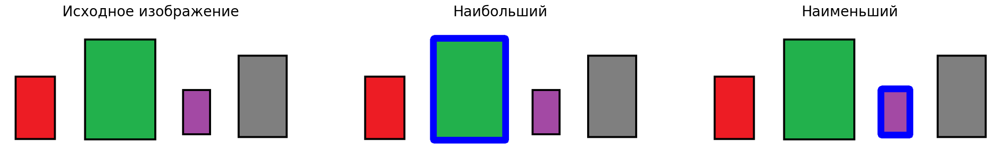

In [ ]:
import cv2
from skimage.io import imread
from matplotlib import pyplot as plt
import numpy as np

img = imread('http://www.learningaboutelectronics.com/images/Containers.png')
img_copy1 = img.copy()
img_copy2 = img.copy()

img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_edges = cv2.Canny(img_gray, 50, 200)
contours, hierarchy = cv2.findContours(img_edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

def get_contour_areas(contours):
    all_areas= []
    for cnt in contours:
        area= cv2.contourArea(cnt)
        all_areas.append(area)
    return all_areas

sorted_contours = sorted(contours, key=cv2.contourArea, reverse= True)
largest_item = sorted_contours[0]
cv2.drawContours(img_copy1, largest_item, -1, (0,0,255), 15)
smallest_item = sorted_contours[-1]
cv2.drawContours(img_copy2, smallest_item, -1, (0,0,255), 15)

font_size = 20
plt.figure(figsize=(25, 8))
plt.subplot(1, 3, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(img)
plt.subplot(1, 3, 2).set_title('Наибольший', fontsize = font_size); plt.axis('off')
plt.imshow(img_copy1, cmap = 'gray')
plt.subplot(1, 3, 3).set_title('Наименьший', fontsize = font_size); plt.axis('off')
plt.imshow(img_copy2)
plt.show()

### Нахождение объектов

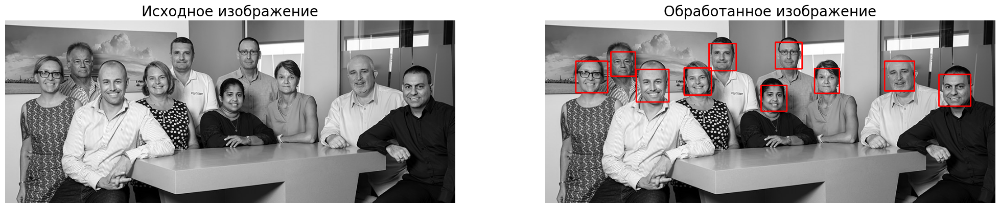

In [ ]:
import cv2
from skimage.io import imread
from matplotlib import pyplot as plt
from skimage.io import imread

img = imread('https://images.squarespace-cdn.com/content/v1/5be44996b98a783889d68ce7/1544065704472-U0MK6PRJVS8ERJBMZ7NL/Corporate+group+shot+Darwin.jpg')
img_copy = img.copy()
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')


faces = face_cascade.detectMultiScale(img_gray, scaleFactor = 1.3, minNeighbors = 5)
for (fx, fy, fw, fh) in faces:
    img = cv2.rectangle(img, (fx, fy), (fx + fw, fy + fh), (255, 0, 0), 2)
    roi_gray = gray[fy:fy+fh, fx:fx+fw]
    roi_color = img[fy:fy+fh, fx:fx+fw]
    eyes = eye_cascade.detectMultiScale(roi_gray)
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color, (ex, ey), (ex + ew, ey + eh), (0, 255, 0), 2)

plt.figure(figsize=(25, 8))
plt.subplot(1, 2, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(img_copy)
plt.subplot(1, 2, 2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(img)
plt.show()

# Домашние задания

## №1
Распознать изображение с игральными картами и вывести изображение и номинал каждой карты

http://farm4.staticflickr.com/3828/9060450367_b67ef44444_o_d.png

1. Прочитайте изображение из файла и выведите его на экран:

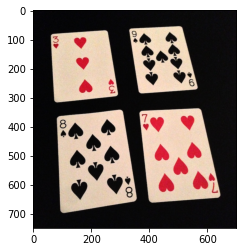

In [2]:
!wget http://farm4.staticflickr.com/3828/9060450367_b67ef44444_o_d.png -O cards_plain.png

--2023-11-07 10:20:40--  http://farm4.staticflickr.com/3828/9060450367_b67ef44444_o_d.png
Resolving farm4.staticflickr.com (farm4.staticflickr.com)... 18.64.173.84, 2600:9000:2342:ec00:0:5a51:64c9:c681, 2600:9000:2342:3600:0:5a51:64c9:c681, ...
Connecting to farm4.staticflickr.com (farm4.staticflickr.com)|18.64.173.84|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://farm4.staticflickr.com/3828/9060450367_b67ef44444_o_d.png [following]
--2023-11-07 10:20:40--  https://farm4.staticflickr.com/3828/9060450367_b67ef44444_o_d.png
Connecting to farm4.staticflickr.com (farm4.staticflickr.com)|18.64.173.84|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 865783 (845K) [image/png]
Saving to: ‘cards_plain.png’

cards_plain.png     100%[===================>] 845.49K  --.-KB/s    in 0.1s    

2023-11-07 10:20:40 (7.12 MB/s) - ‘cards_plain.png’ saved [865783/865783]



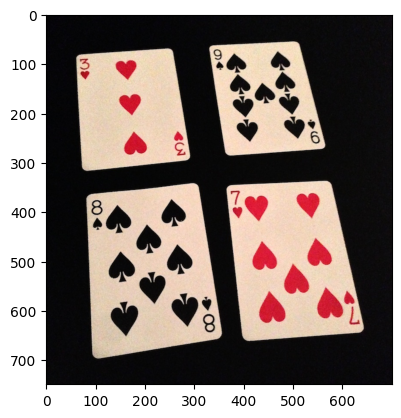

In [3]:
import cv2
import matplotlib.pyplot as plt
from skimage.io import imread
import numpy as np

img = cv2.imread("cards_plain.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

2. Выполните последоватьельно 2 преобразования: переведите изображение в оттенки серого (COLOR_BGR2GRAY) и примените размытие (GaussianBlur):

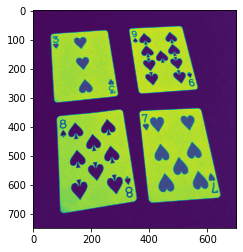

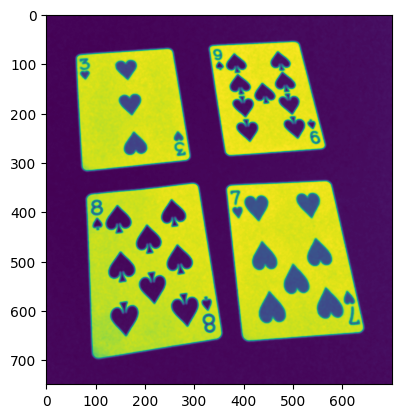

In [4]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7, 7), 0)
plt.imshow(blur)
plt.show()

3. Найдите 4 контура максимального размера и выведите их на исходном изображении:

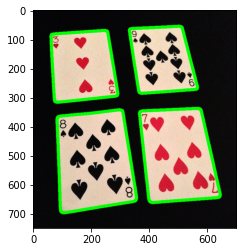

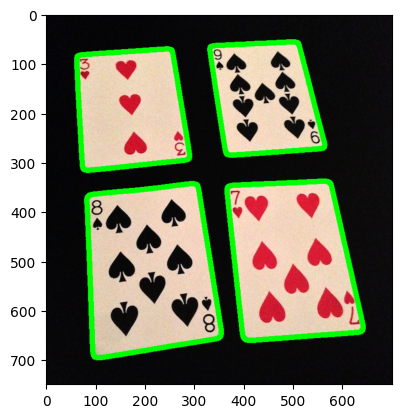

In [5]:
numcards = 4

flag, thresh = cv2.threshold(blur, 127, 255, cv2.THRESH_BINARY)
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
contours = sorted(contours, key=cv2.contourArea, reverse=True)[:numcards]

contours_img = img.copy()
cv2.drawContours(contours_img, contours, contourIdx = -1, color = (0, 255, 0, 255), thickness = 10)
plt.imshow(contours_img)
plt.show()

4. Примените к каждому контуру проективное преобразование и выведите отдельным изображением:

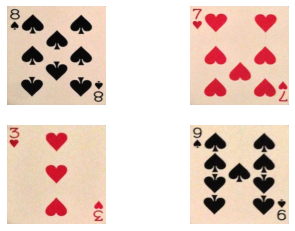

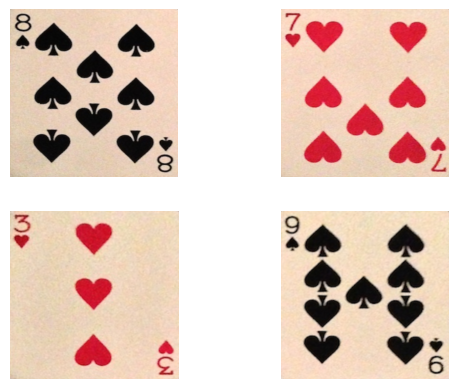

In [6]:
for i in range(numcards):
  card = contours[i]
  peri = cv2.arcLength(card,True)
  approx = np.array(cv2.approxPolyDP(card,0.02*peri,True), np.float32)
  rect = cv2.minAreaRect(contours[2])
  r = cv2.boxPoints(rect)
  h = np.array([[0,0],[450,0],[450, 450],[0,450]], np.float32)
  transform = cv2.getPerspectiveTransform(approx,h)
  warp = cv2.warpPerspective(img,transform,(450,450))[:,::-1]
  plt.subplot(2,2,i+1); plt.axis('off')
  plt.imshow(warp)

plt.show()

5. Найдите количество символов на одной карте:
- на изображение карты найдите все контуры;
- найдите максимальный контур (не совпадающий с самой картой);
- найдите другие контуры, отличающиеся от максимального по размеру не более 10%;
- посчитайте количество максимальных контуров.

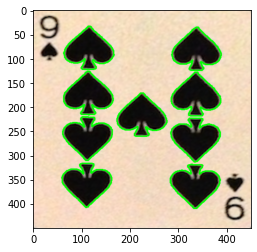

9


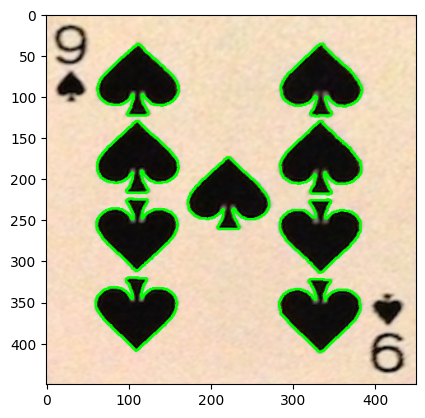

'9'

In [7]:
img_gray = cv2.cvtColor(warp,cv2.COLOR_RGB2GRAY)
contours_img = warp.copy()

flag, thresh = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)
contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
contours = sorted(contours, key=cv2.contourArea, reverse=True)

main_contours = []
main_area = 0
for contour in contours:
  if cv2.contourArea(contour) > .9*warp.shape[0]*warp.shape[1]: continue
  if main_area == 0:
    main_contours.append(contour)
    main_area = cv2.contourArea(contour)
  else:
    if cv2.contourArea(contour) > .9 * main_area :
      main_contours.append(contour)
print(len(main_contours))

cv2.drawContours(contours_img, main_contours, contourIdx = -1, color = (0, 255, 0, 255), thickness = 2)
plt.imshow(contours_img)
plt.show()

str(len(main_contours))

6. Соберите все предыдущие команды в один код, чтобы на выходе получилось следующее изображение:

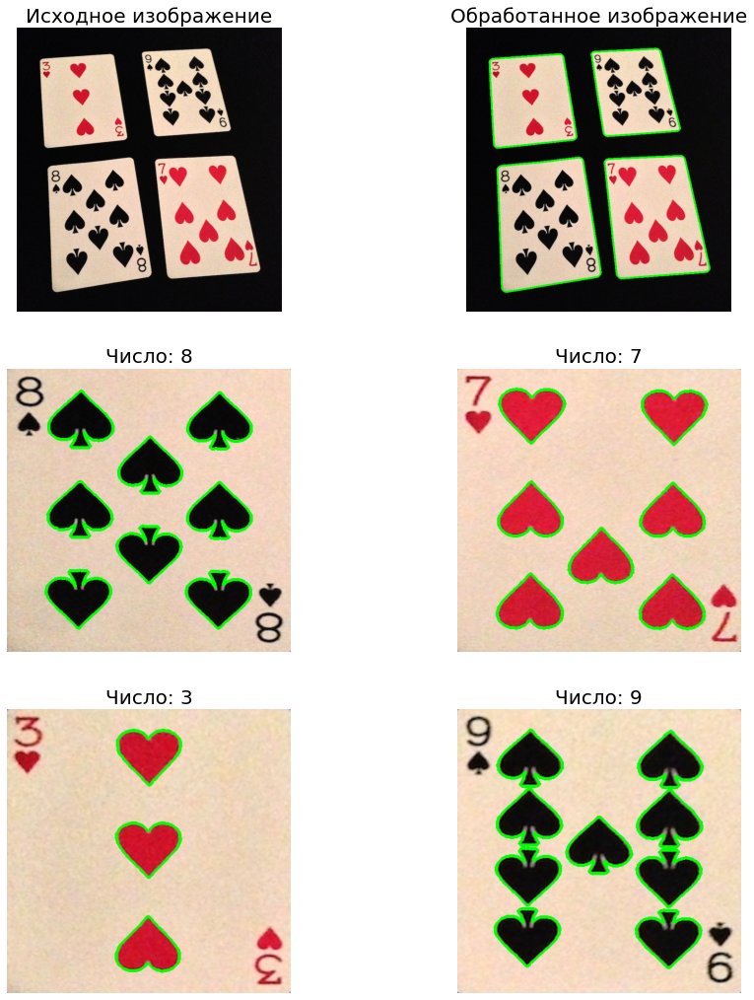

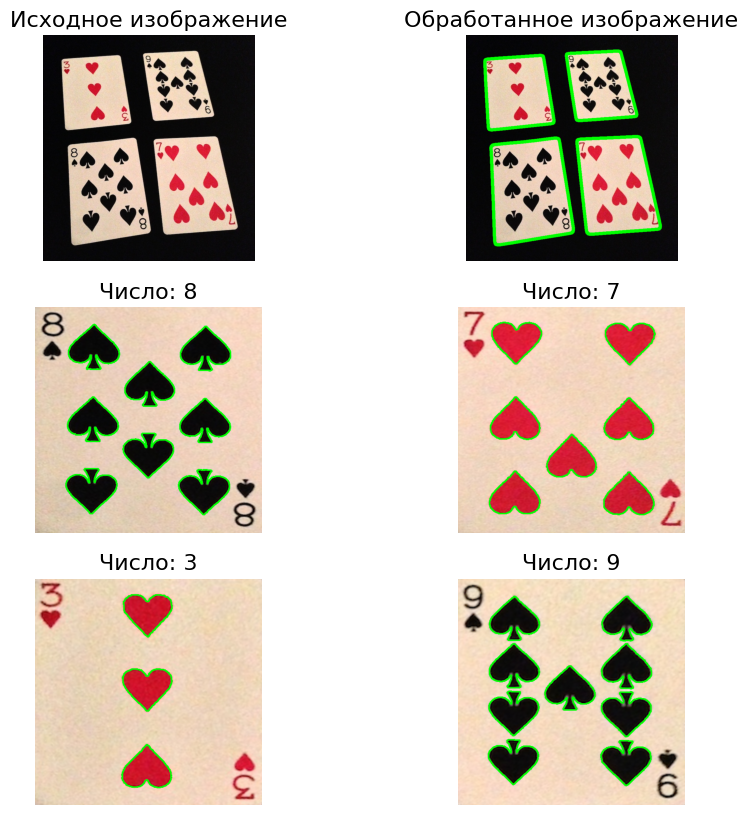

In [11]:
font_size = 16
plt.figure(figsize=(10, 10))

img = cv2.imread("cards_plain.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.subplot(3, 2, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(img)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7, 7), 0)

numcards = 4
flag, thresh = cv2.threshold(blur, 127, 255, cv2.THRESH_BINARY)
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
contours = sorted(contours, key=cv2.contourArea, reverse=True)[:numcards]
contours_img = img.copy()
cv2.drawContours(contours_img, contours, contourIdx = -1, color = (0, 255, 0, 255), thickness = 10)
plt.subplot(3, 2, 2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(contours_img)

def count_symbols(card: np.ndarray):
  img_gray = cv2.cvtColor(card,cv2.COLOR_RGB2GRAY)
  contours_img = card.copy()

  flag, thresh = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)
  contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
  contours = sorted(contours, key=cv2.contourArea, reverse=True)

  main_contours = []
  main_area = 0
  for contour in contours:
    if cv2.contourArea(contour) > .9*warp.shape[0]*warp.shape[1]: continue
    if main_area == 0:
      main_contours.append(contour)
      main_area = cv2.contourArea(contour)
    else:
      if cv2.contourArea(contour) > .9 * main_area :
        main_contours.append(contour)

  cv2.drawContours(contours_img, main_contours, contourIdx = -1, color = (0, 255, 0, 255), thickness = 2)

  return contours_img, len(main_contours)

for i in range(numcards):
  card = contours[i]
  peri = cv2.arcLength(card,True)
  approx = np.array(cv2.approxPolyDP(card,0.02*peri,True), np.float32)
  rect = cv2.minAreaRect(contours[2])
  r = cv2.boxPoints(rect)
  h = np.array([[0,0],[450,0],[450, 450],[0,450]], np.float32)
  transform = cv2.getPerspectiveTransform(approx,h)
  warp = cv2.warpPerspective(img,transform,(450,450))[:,::-1]

  symbols_img, symbols_count = count_symbols(warp)
  plt.subplot(3, 2, i+3).set_title(f"Число: {symbols_count}", fontsize = font_size); plt.axis('off')
  plt.imshow(symbols_img)

## №2
Подумайте, что нужно изменить, чтобы код сработал для этого изображения:

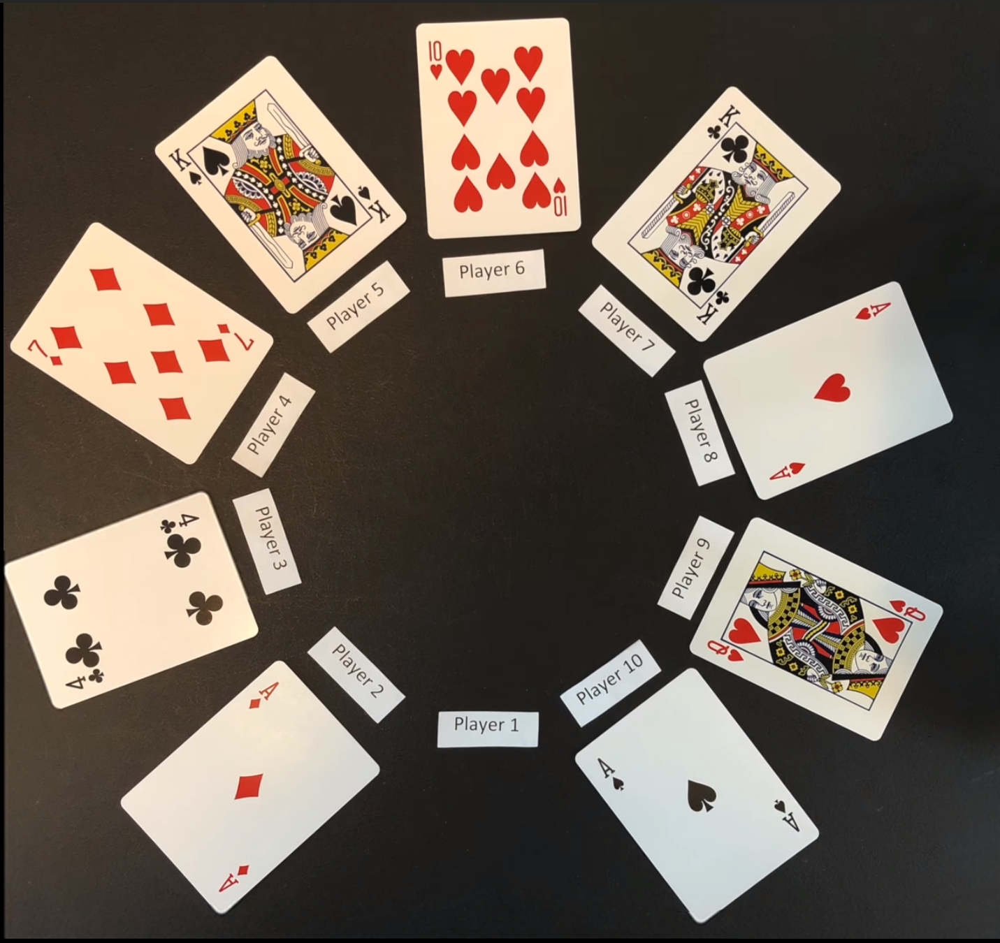

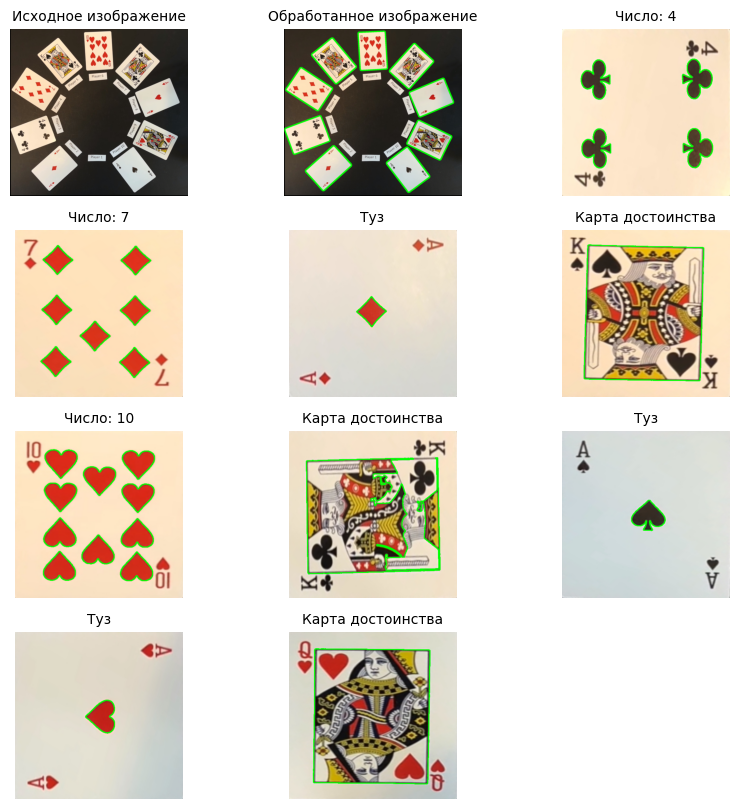

In [14]:
font_size = 10
plt.figure(figsize=(10, 10))

img = cv2.imread("cards_round.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.subplot(4, 3, 1).set_title('Исходное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(img)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7, 7), 0)

numcards = 9
flag, thresh = cv2.threshold(blur, 127, 255, cv2.THRESH_BINARY)
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
contours = sorted(contours, key=cv2.contourArea, reverse=True)[:numcards]
contours_img = img.copy()
cv2.drawContours(contours_img, contours, contourIdx = -1, color = (0, 255, 0, 255), thickness = 10)
plt.subplot(4, 3, 2).set_title('Обработанное изображение', fontsize = font_size); plt.axis('off')
plt.imshow(contours_img)

def count_symbols(card: np.ndarray):
  img_gray = cv2.cvtColor(card,cv2.COLOR_RGB2GRAY)
  contours_img = card.copy()

  flag, thresh = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)
  contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_NONE)
  contours = sorted(contours, key=cv2.contourArea, reverse=True)

  main_contours = []
  main_area = 0
  for contour in contours:
    if cv2.contourArea(contour) > .9*warp.shape[0]*warp.shape[1]: continue
    if main_area == 0:
      main_contours.append(contour)
      main_area = cv2.contourArea(contour)
    else:
      if cv2.contourArea(contour) > .9 * main_area :
        main_contours.append(contour)

  contours_count = -1 if main_area > 0.3*warp.shape[0]*warp.shape[1] else len(main_contours)


  cv2.drawContours(contours_img, main_contours, contourIdx = -1, color = (0, 255, 0, 255), thickness = 2)

  return contours_img, contours_count

for i in range(numcards):
  card = contours[i]
  peri = cv2.arcLength(card,True)
  approx = np.array(cv2.approxPolyDP(card,0.02*peri,True), np.float32)
  rect = cv2.minAreaRect(contours[2])
  r = cv2.boxPoints(rect)
  h = np.array([[0,0],[450,0],[450, 450],[0,450]], np.float32)
  transform = cv2.getPerspectiveTransform(approx,h)
  warp = cv2.warpPerspective(img,transform,(450,450))[:,::-1]

  symbols_img, symbols_count = count_symbols(warp)
  subplot = plt.subplot(4, 3, i+3)
  if symbols_count > 1:
    subplot.set_title(f"Число: {symbols_count}", fontsize = font_size)
  elif symbols_count == -1:
    subplot.set_title(f"Карта достоинства", fontsize = font_size)
  elif symbols_count == 1:
    subplot.set_title(f"Туз", fontsize = font_size)

  plt.axis('off')
  plt.imshow(symbols_img)